# Exploratory Data Analysis and Dimensionality Reduction techniques
Notebook supporting 

*A Topological Data Analysis Mapper of the ovarian folliculogenesis based on MALDI Mass Spectrometry Imaging proteomics*, 
Giulia Campi, Giovanna Nicora, Giulia Fiorentino, Andrew Smith, Fulvio Magni, Silvia Garagna, Maurizio Zuccotti, Riccardo Bellazzi.

In [26]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
sns.set_style('whitegrid')

Import spectral data from spots.

In [109]:
path = '/Users/giuliacampi/Documents/Universita/Laurea_Magistrale/Tesi/Dati/'
df = pd.read_csv(path + 'prot_df.csv', index_col=0)
repeated_spots = df.groupby('spot').count()
repeated_spots = repeated_spots[repeated_spots['foll_id'] > 1].index
for spot in repeated_spots:
    ids = df[df['spot'] == spot].index
    df.drop(ids, axis = 0, inplace = True)
foll_types = df.drop(['spot'],axis=1).groupby('foll_id')['type'].max()
mz_list = df.drop(['foll_id','spot','type'], axis = 1).columns

In [107]:
labels = pd.DataFrame(index=df.index)
labels['type'] = pd.Categorical(df['type'])
def type2cat(x):
    if ((x == 'T4') | (x == 'T5')):
        return 'pre-antral'
    if ((x == 'T6') | (x == 'T7')):
        return 'antral'
    else:
        return 'pre-ovulatory'
labels['cat'] = labels['type'].apply(type2cat)
labels['foll'] = df['foll_id']

In [90]:
prot_dict = pd.read_excel(pd.ExcelFile(path + 'protein_identification.xlsx'))
prot_dict.columns = ['prot', 'mz','other_prots']
xticks = []
for i in np.arange(prot_dict.shape[0]):
    label = prot_dict.iloc[i]['prot'].split('_')[0]
    count = 1
    other_prots = str(prot_dict.iloc[i]['other_prots'])
    if not other_prots.split(' ')[0] == 'nan':
        for other_prot in [p.split('_')[0] for p in other_prots.split(' ')]:
            if count == 1:
                label += ', ' + other_prot
            elif count == 5:
                label += ',\n' + other_prot
            else:
                label += ', ' + other_prot
            count +=1
    xticks.append(label)

## Exploratory Data Analysis

# spots: 29189


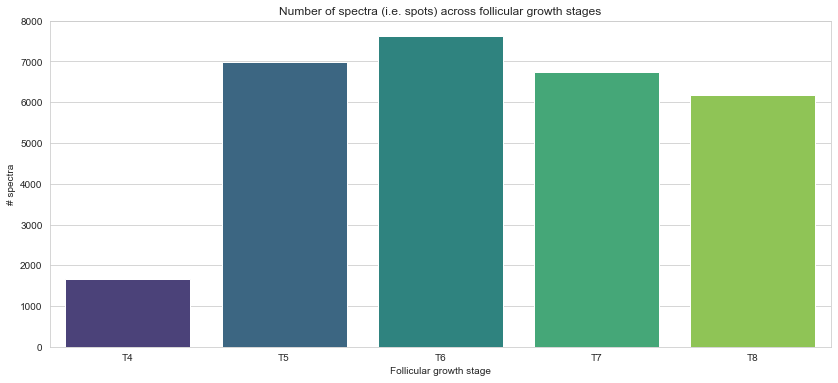

In [146]:
print('# spots: {}'.format(len(df)))
plt.figure(figsize=(14,6))
sns.countplot(df['type'], palette = 'viridis')
plt.xlabel('Follicular growth stage')
plt.ylabel('# spectra')
plt.title('Number of spectra (i.e. spots) across follicular growth stages');

# follicles:  59


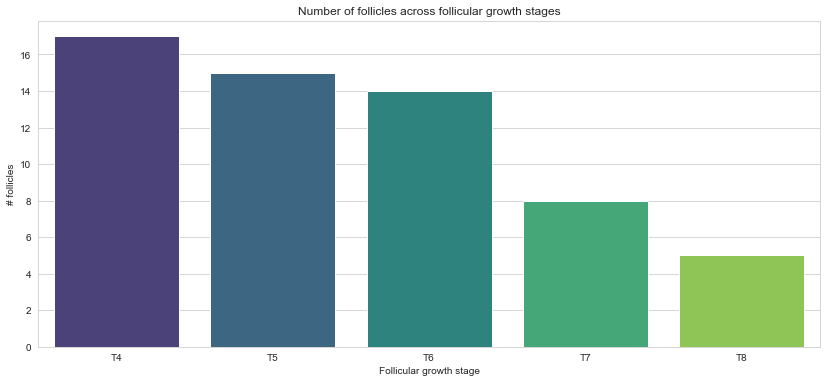

In [145]:
print('# follicles: ', df['foll_id'].nunique())
plt.figure(figsize=(14,6))

folls = pd.DataFrame(index = df['type'].unique(),columns = ['n_foll'])
for foll_type in df['type'].unique():
    folls.loc[foll_type] = len(df[df['type'] == foll_type].groupby('foll_id'))

sns.barplot(x = folls.index, y = folls['n_foll'],palette='viridis')
plt.xlabel('Follicular growth stage')
plt.ylabel('# follicles')
plt.title('Number of follicles across follicular growth stages');

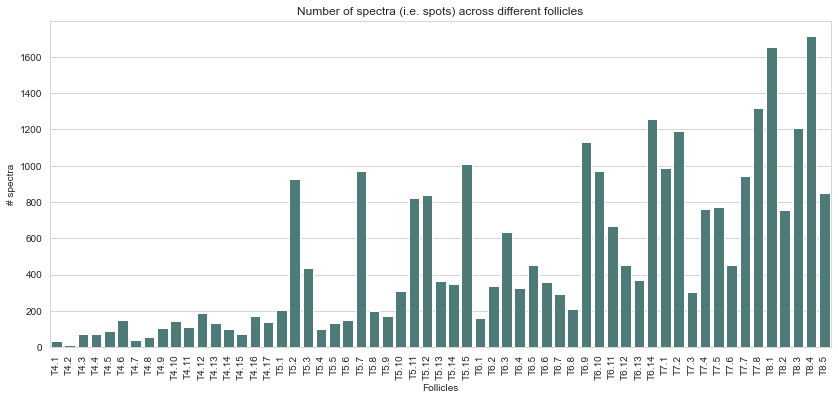

In [147]:
plt.figure(figsize=(14,6))
sns.countplot(df['foll_id'],color='#47817E')
plt.xticks(rotation=90)
plt.xlabel('Follicles')
plt.ylabel('# spectra')
plt.title('Number of spectra (i.e. spots) across different follicles');


                                   Protein distribution across follicular growth stages


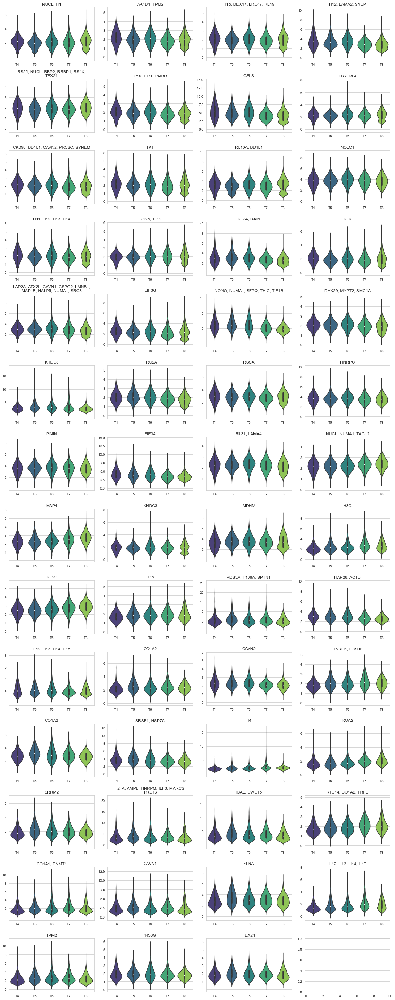

In [154]:
print()
print('                                   Protein distribution across follicular growth stages')
n = 4
fig,axes = plt.subplots(14,n)
fig.set_figwidth(16)
fig.set_figheight(40)
i = 0
for k, mz in enumerate(mz_list):
    sns.violinplot(x = 'type', y = mz, data = df, ax = axes[i,np.mod(k,n)],palette='viridis')
    axes[i,np.mod(k,n)].set_xlabel('')
    axes[i,np.mod(k,n)].set_ylabel('')
    axes[i,np.mod(k,n)].set_title(xticks[k])
    if np.mod(k,n) == n-1:
        i += 1
plt.tight_layout();


         Follicle spectra visualization through mean value and standard deviation


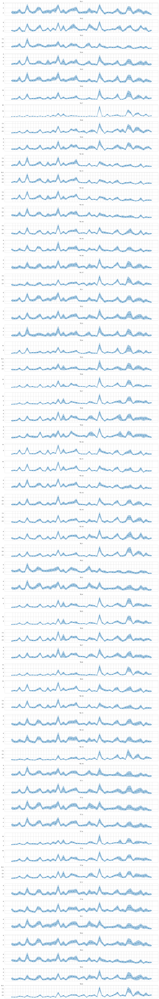

In [199]:
dff = df.drop(['spot','type','foll_id'],axis=1).astype('float64')
dff['foll_id'] = df['foll_id']
df_foll_mean = dff.groupby('foll_id').mean()
df_foll_std = dff.groupby('foll_id').std()

print()
print('         Follicle spectra visualization through mean value and standard deviation')
n = 1
fig,axes = plt.subplots(59,n)
fig.set_figwidth(16)
fig.set_figheight(100)
i = 0
for k, foll in enumerate(df['foll_id'].unique()):
    axes[i].plot(df_foll_mean.loc[foll],'-o',linewidth = 0.75, markersize = 4,label = 'Mean value')
    axes[i].fill_between(np.arange(55),df_foll_mean.loc[foll] - df_foll_std.loc[foll], df_foll_mean.loc[foll] + df_foll_std.loc[foll], alpha = 0.4, label='Standard deviation')
    axes[i].set_xticks(np.arange(len(xticks)) + 0.4)
    axes[i].set_xticklabels('')
    #axes[i].set_xticklabels(xticks, fontsize=8, rotation=40, ha = 'right')
    axes[i].set_ylabel('')
    axes[i].set_title(foll)
    i += 1
fig.tight_layout();

Protein correlation (*Pearson*)

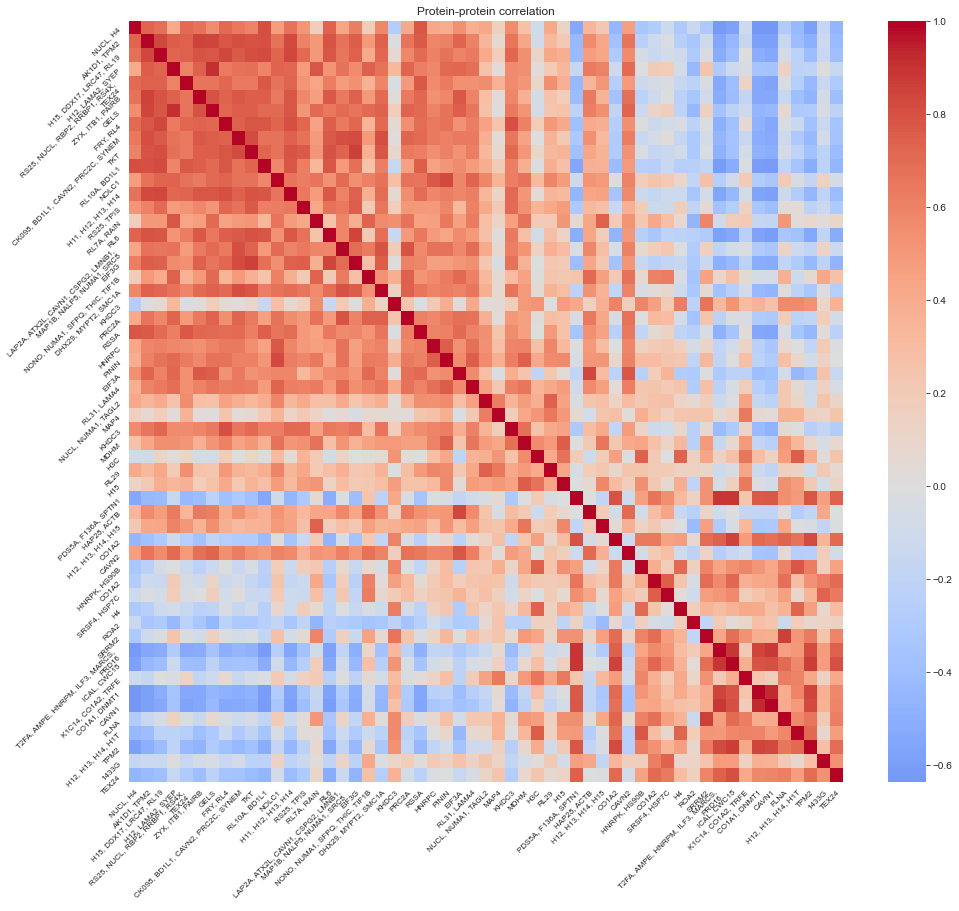

In [166]:
corr = df.drop(['foll_id','spot','type'], axis = 1).astype('float64').corr(method = 'pearson')
plt.figure(figsize=(16,14))
plt.title('Protein-protein correlation')
sns.heatmap(corr, center = 0, cmap = 'coolwarm')
plt.xticks(np.arange(len(xticks))+0.8,xticks,fontsize=8, ha = 'right', rotation = 45)
plt.yticks(np.arange(len(xticks))+0.4,xticks,fontsize=8, va = 'top', rotation = 45);

Visualization setup

In [237]:
import cufflinks as cf
import plotly.express as px
from plotly.offline import download_plotlyjs,init_notebook_mode,plot,iplot
init_notebook_mode(connected=True)
cf.go_offline()

In [286]:
def embedding_visualization(data_frame, method):
    fig = px.scatter_3d(data_frame, x = method+'1', y = method+'2', z = method+'3', opacity = 1, size = np.ones(len(data_frame)), size_max=5,
                        color = labels['type'], color_discrete_sequence = px.colors.sequential.Viridis[::2], 
                        labels = {method + '1': method + '1',
                                  method + '2': method + '2',
                                  method + '3': method + '3',
                                  'color': 'Follicular growth stage'})
                                                                
    fig.update_traces(marker=dict(opacity = 0.8, line=dict(width=0,color='Black')))
    fig.update_layout(legend_title='Follicular growth stage')
    fig.show()

## Dimensionality reduction techniques
Data scaling

In [211]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
data = pd.DataFrame(scaler.fit_transform(df.drop(['foll_id', 'spot', 'type'], axis = 1)))

### Principal Component Analysis (PCA)

In [212]:
from sklearn.decomposition import PCA
pca = PCA(n_components=3)
pca_results = pd.DataFrame(data = pca.fit_transform(data), columns = ['PC1','PC2','PC3'])

In [213]:
print('Explained variance ratio per principal component: {}'.format(pca.explained_variance_ratio_))
print('Total explained variance ratio: {}'.format(pca.explained_variance_ratio_.sum()))
print('Eigenvalues: {}'.format(pca.explained_variance_))

Explained variance ratio per principal component: [0.39629842 0.21732063 0.08772423]
Total explained variance ratio: 0.7013432683540488
Eigenvalues: [21.79715965 11.953044    4.82499768]


In [285]:
embedding_visualization(pca_results, 'PC')

Components analysis

In [214]:
components = pd.DataFrame(abs(pca.components_), columns = df.columns[2:-1], index = ['PC1','PC2','PC3'])

In [223]:
i = 1
for component in pca.components_: 
    print('======================================================== PC{} ========================================================'.format(i))
    i+=1
    print (" + ".join("(%.2f x %s)" % (value, name) for value, name in zip(component, prot_df.columns[2:-1])))
    print()

======================================================== PC1 ========================================================
(0.16 x NUCL) + (0.20 x AK1D1) + (0.19 x H15) + (0.17 x H12) + (0.17 x RS25) + (0.19 x ZYX) + (0.19 x GELS) + (0.19 x FRY) + (0.19 x CK098) + (0.19 x TKT) + (0.18 x RL10A) + (0.17 x NOLC1) + (0.19 x H11) + (0.15 x RS25_1) + (0.13 x RL7A) + (0.18 x RL6) + (0.16 x LAP2A) + (0.17 x EIF3G) + (0.12 x NONO) + (0.18 x DHX29) + (0.01 x KHDC3) + (0.16 x PRC2A) + (0.18 x RSSA) + (0.15 x HNRPC) + (0.16 x PININ) + (0.16 x EIF3A) + (0.16 x RL31) + (0.10 x NUCL_1) + (0.03 x MAP4) + (0.16 x KHDC3_1) + (0.13 x MDHM) + (0.01 x H3C) + (0.10 x RL29) + (0.08 x H15_1) + (-0.10 x PDS5A) + (0.13 x HAP28) + (0.11 x H12_1) + (-0.07 x CO1A2) + (0.15 x CAVN2) + (-0.03 x HNRPK) + (-0.01 x CO1A2_1) + (0.00 x SRSF4) + (-0.03 x H4) + (-0.08 x ROA2) + (-0.00 x SRRM2) + (-0.13 x T2FA) + (-0.10 x ICAL) + (-0.01 x K1C14) + (-0.14 x CO1A1) + (-0.14 x CAVN1) + (-0.02 x FLNA) + (-0.07 x H12_2) + (-0.11 x TP

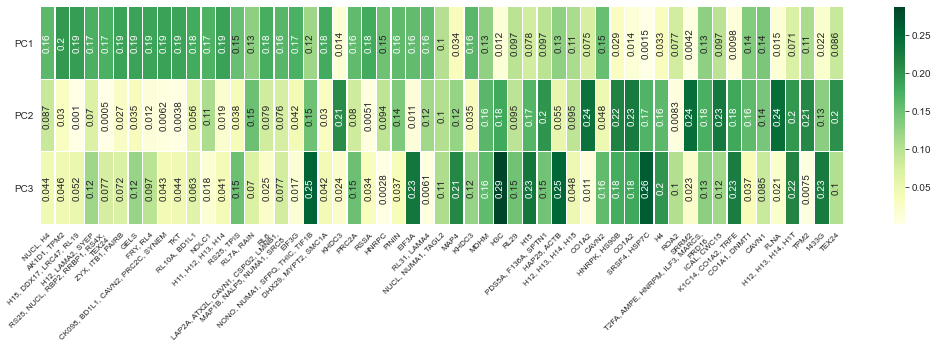

In [229]:
plt.figure(figsize=(18,4))
sns.heatmap(components,cmap='YlGn',linecolor='white', linewidths=0.25,
            annot=True, annot_kws={'rotation':90}, cbar= True)
plt.yticks(rotation=0)
plt.xticks(np.arange(len(xlabels))+0.8,xlabels,fontsize=8, ha = 'right', rotation = 45);

Evaluation of the optimal number of components.

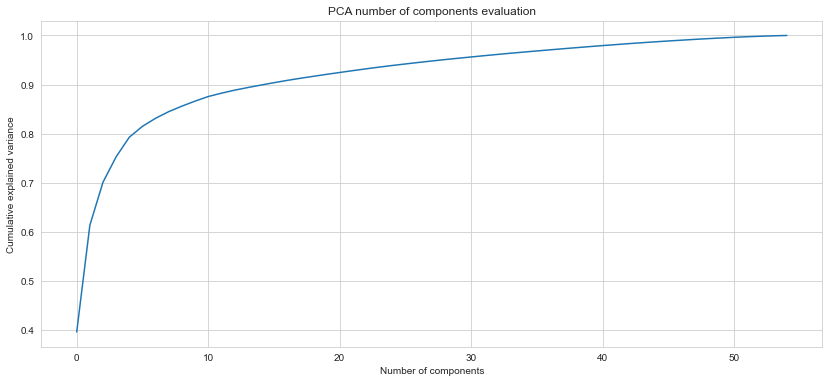

In [231]:
pca_tot = PCA().fit(data)
cev = np.cumsum(pca_tot.explained_variance_ratio_)
plt.figure(figsize=(14,6))
plt.plot(cev)
plt.xlabel('Number of components')
plt.ylabel('Cumulative explained variance');
plt.title('PCA number of components evaluation');

### t-distributed Stochastic Neighbor Embedding (tSNE)

In [265]:
from sklearn.manifold import TSNE
perplexity = 100
tsne = TSNE(n_components = 3, perplexity = perplexity)
tsne_results = pd.DataFrame(data = tsne.fit_transform(data), columns = ['tsne1','tsne2','tsne3'])

In [266]:
tsne.kl_divergence_

2.0863423347473145

In [287]:
embedding_visualization(tsne_results, 'tsne')

### Uniform Manifold Approximation and Projection (UMAP)

In [289]:
import umap
n_neighbors = 250
umapp = umap.UMAP(n_components=3, n_neighbors = n_neighbors, random_state=42, metric='cosine')
umap_results = pd.DataFrame(umapp.fit_transform(data), columns = ['umap1','umap2','umap3'])

In [290]:
embedding_visualization(umap_results, 'umap')